In [4]:
import h5py
import hdf5plugin
import numpy as np

# Open your HDF5 file
with h5py.File('mean_sae_latent_fairface2.hdf5', 'r') as f:
    latents = f['training/mean_aggregated_latents'][:]  # shape (11842, 4096)
    race_labels = f['training/labels/race'][:]           # shape (11842,)

In [5]:
def get_top_k_activations(latents, labels, k=20):
    """
    Returns:
        top_vals: (n_latents, k) array of top-k activation values
        top_labels: (n_latents, k) array of race labels for the top-k activations
    """
    n_samples, n_latents = latents.shape
    top_vals = np.zeros((n_latents, k))
    top_labels = np.zeros((n_latents, k), dtype=np.uint8)

    for i in range(n_latents):
        latent_col = latents[:, i]
        top_k_indices = np.argpartition(-latent_col, k)[:k]  # get indices of top-k
        top_k_sorted = top_k_indices[np.argsort(-latent_col[top_k_indices])]  # sort them
        top_vals[i] = latent_col[top_k_sorted]
        top_labels[i] = labels[top_k_sorted]

    return top_vals, top_labels

top_val, top_label = get_top_k_activations(latents, race_labels, k=20)


In [6]:
def compute_entropy(top_val, top_label, eps=1e-9):
    """
    top_val: (n_latents, k) array
    top_label: (n_latents, k) array
    Returns: entropy (n_latents,) array
    """
    n_latents, k = top_val.shape
    entropy = np.zeros(n_latents)

    for i in range(n_latents):
        labels, counts = np.unique(top_label[i], return_counts=True)
        if len(labels) == 0 or counts.sum() < 10:
            entropy[i] = -1  # not enough data
            continue

        # Compute summed activation per label
        summed = np.array([top_val[i][top_label[i] == label].sum() for label in labels])
        probs = summed / (summed.sum() + eps)
        entropy[i] = -np.sum(probs * np.log(probs + eps))

    return entropy

top_entropy = compute_entropy(top_val, top_label)


Data viz

In [7]:
# Sparsity: % of samples with positive activation
sparsity = (latents > 0).sum(axis=0) / latents.shape[0]

# Mean positive activation value per latent
mean_activation = np.array([
    latents[:, i][latents[:, i] > 0].mean() if (latents[:, i] > 0).any() else 0
    for i in range(latents.shape[1])
])

# For now, label_std = stddev of race labels that activated this latent (very rough proxy)
label_std = np.array([
    top_label[i].std() if len(top_label[i]) > 0 else 0
    for i in range(top_label.shape[0])
])

In [8]:
import pandas as pd
from collections import Counter

# Get dominant race label per latent
dominant_race = [
    Counter(top_label[i]).most_common(1)[0][0] if len(top_label[i]) > 0 else 'unknown'
    for i in range(len(top_label))
]

# Build the DataFrame
df = pd.DataFrame({
    'latent_index': np.arange(len(sparsity)),
    'log_sparsity': sparsity,
    'log_mean_activation': mean_activation,
    'entropy': top_entropy,
    'dominant_race': dominant_race
})


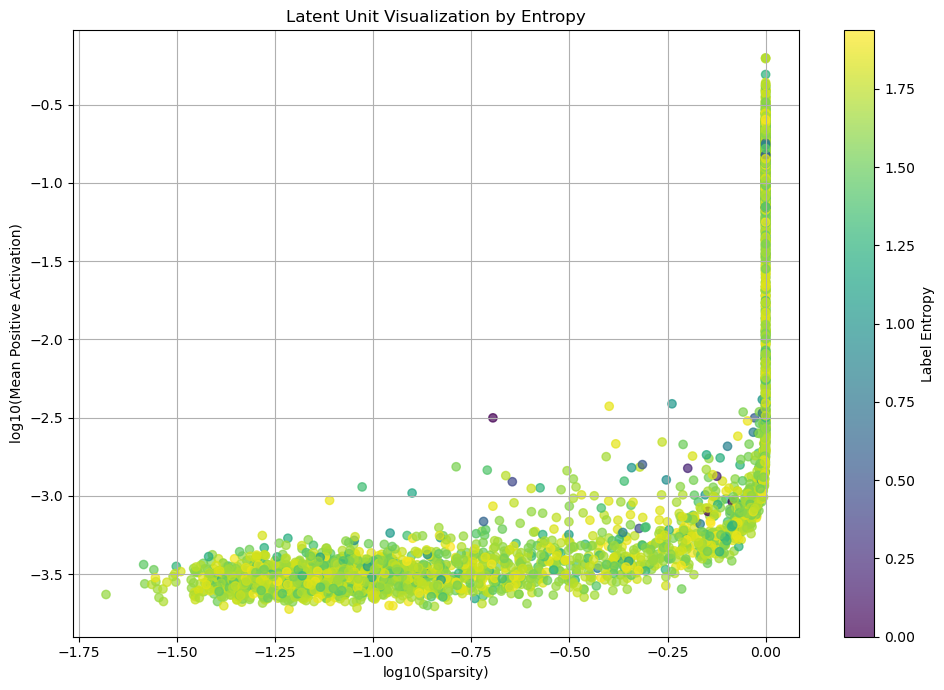

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming you've already computed:
# - sparsity: shape (4096,)
# - mean_activation: shape (4096,)
# - top_entropy: shape (4096,)
# - label_std: shape (4096,) (optional)

plt.figure(figsize=(10, 7))

# Use top_entropy as color
scatter = plt.scatter(
    np.log10(sparsity + 1e-9),
    np.log10(mean_activation + 1e-9),
    c=top_entropy,
    cmap='viridis',
    alpha=0.7
)

plt.colorbar(scatter, label="Label Entropy")
plt.xlabel("log10(Sparsity)")
plt.ylabel("log10(Mean Positive Activation)")
plt.title("Latent Unit Visualization by Entropy")
plt.grid(True)
plt.tight_layout()
plt.show()





In [37]:
import h5py
import numpy as np
import pandas as pd

# Parameters

####################
# these ones isolated 1 feature for race 0 = east asian and 2 for race 2 = Black
# k1, k2, k3 = 1000, 500, 100
# entropy_threshold = 2  # relaxed threshold
# epsilon = 1e-5
# top_k_images = 12
#####################

k1, k2, k3 = 800, 600, 100
entropy_threshold = 2  # relaxed threshold
epsilon = 1e-5
top_k_images = 12

print("🔍 Loading HDF5 data...")
with h5py.File('sae_agg_latents.hdf5', 'r') as f:
    latents = f['training/data/mean'][:]             # (N, D)
    race_labels = f['training/labels/race'][:]       # (N,)
    original_indices = f['training/original_indices'][:]  # (N,)

n_samples, n_latents = latents.shape
unique_races = np.unique(race_labels)
print(f"✅ Loaded {n_samples} samples, {n_latents} latents, {len(unique_races)} race labels.\n")

race_sdf_dict = {}
result_rows = []

for race in unique_races:
    print(f"🔧 Processing race {race}...")

    mask = race_labels == race
    latents_race = latents[mask]

    # Step i: Intra-class frequency
    active_mask = latents_race > epsilon
    freq = active_mask.sum(axis=0) / active_mask.shape[0]
    top_k1 = np.argsort(-freq)[:k1]

    # Step ii: Intra-class average activation
    selected_latents = latents_race[:, top_k1]
    sum_activations = np.where(selected_latents > epsilon, selected_latents, 0).sum(axis=0)
    num_active = (selected_latents > epsilon).sum(axis=0)
    avg_activation = sum_activations / np.maximum(num_active, 1)
    top_k2_rel = np.argsort(-avg_activation)[:k2]
    top_k2 = top_k1[top_k2_rel]

    # Step iii: Inter-class entropy
    entropies = []
    for idx in top_k2:
        vals = latents[:, idx]
        active = vals > epsilon
        if active.sum() < 10:
            entropies.append(np.inf)
            continue
        class_weights = np.bincount(
            race_labels[active], weights=vals[active], minlength=unique_races.max() + 1
        )
        probs = class_weights / class_weights.sum()
        entropy = -np.sum(probs[probs > 0] * np.log(probs[probs > 0]))
        entropies.append(entropy)

    entropies = np.array(entropies)
    print(f"    Entropy stats: min={entropies.min():.3f}, median={np.median(entropies):.3f}, max={entropies.max():.3f}")

    # Filter by threshold
    entropy_mask = entropies < entropy_threshold
    filtered_latents = top_k2[entropy_mask]
    final_k = np.argsort(entropies[entropy_mask])[:k3] if len(filtered_latents) >= k3 else np.arange(len(filtered_latents))
    sdf_latents = filtered_latents[final_k]
    race_sdf_dict[int(race)] = sdf_latents.tolist()
    print(f"✅ Race {race}: selected {len(sdf_latents)} latents under entropy < {entropy_threshold}")

    # Collect top-k images per latent
    for latent_idx in sdf_latents:
        activations = latents[:, latent_idx]
        top_idxs = np.argsort(-activations)[:top_k_images]
        print(f"    Latent {latent_idx} top images: {original_indices[top_idxs].tolist()}")
        for idx in top_idxs:
            result_rows.append({
                'race': int(race),
                'latent': int(latent_idx),
                'true_race': int(race_labels[idx]),
                'original_index': int(original_indices[idx])
            })

# Save SDFs per race
print("\n🎯 Final SDFs per race (entropy-filtered):")
for race, sdf in race_sdf_dict.items():
    print(f"Race {race}: {sdf}")

df = pd.DataFrame(result_rows)
df.to_csv('filtered_top5_image_indices_per_sdf_per_race.csv', index=False)
print("\n💾 Saved results to 'filtered_top5_image_indices_per_sdf_per_race.csv'")


🔍 Loading HDF5 data...
✅ Loaded 11842 samples, 4096 latents, 7 race labels.

🔧 Processing race 0...
    Entropy stats: min=1.915, median=1.945, max=1.946
✅ Race 0: selected 100 latents under entropy < 2
    Latent 4080 top images: [55397, 81167, 8387, 80047, 35062, 1712, 15175, 4442, 40136, 3431, 13255, 85399]
    Latent 1439 top images: [78143, 40136, 29534, 61439, 2305, 59849, 7676, 84480, 75542, 30805, 39680, 3257]
    Latent 2156 top images: [69847, 56751, 6431, 58896, 70649, 16615, 39323, 36465, 47003, 66050, 83900, 10324]
    Latent 400 top images: [61877, 6765, 39221, 9587, 54254, 73663, 40948, 62623, 78129, 11231, 80473, 34771]
    Latent 1858 top images: [78674, 10468, 44076, 7893, 9412, 29776, 78697, 13462, 42795, 78504, 54567, 55447]
    Latent 3685 top images: [47144, 55447, 15119, 18532, 29122, 48201, 74328, 72302, 19475, 61572, 83172, 60918]
    Latent 3675 top images: [38438, 12554, 86433, 82770, 69483, 44317, 35743, 5913, 81785, 5958, 73990, 56202]
    Latent 3556 top i

In [38]:
import pandas as pd

# Load CSV
df = pd.read_csv("filtered_top5_image_indices_per_sdf_per_race.csv")

# Sanity check
assert {'race', 'true_race', 'latent', 'original_index'}.issubset(df.columns), "Missing required columns."

# Group by (race, latent) and compute alignment rate
grouped = df.groupby(['race', 'latent'])

per_latent_accuracy = grouped.apply(
    lambda g: (g['race'] == g['true_race']).sum() / len(g)
).reset_index(name='alignment_rate')

# Group by race to compute mean accuracy across its 10 SDFs
per_race_accuracy = per_latent_accuracy.groupby('race')['alignment_rate'].mean().reset_index()
per_race_accuracy.rename(columns={'alignment_rate': 'mean_alignment_rate'}, inplace=True)

# Print summaries
print("🔍 Per-latent alignment rate (top 5 activations):")
print(per_latent_accuracy.head(15))  # Show first few

print("\n📊 Mean SDF alignment accuracy per race:")
print(per_race_accuracy)

# Optionally save to CSV
per_latent_accuracy.to_csv('sdf_alignment_per_latent.csv', index=False)
per_race_accuracy.to_csv('sdf_alignment_summary_per_race.csv', index=False)
print("\n✅ Saved alignment summaries to CSV.")


🔍 Per-latent alignment rate (top 5 activations):
    race  latent  alignment_rate
0      0      10        0.000000
1      0      20        0.083333
2      0      56        0.083333
3      0      57        0.166667
4      0     123        0.250000
5      0     134        0.000000
6      0     148        0.000000
7      0     168        0.000000
8      0     206        0.083333
9      0     211        0.000000
10     0     227        0.750000
11     0     232        0.250000
12     0     250        0.166667
13     0     301        0.166667
14     0     306        0.000000

📊 Mean SDF alignment accuracy per race:
   race  mean_alignment_rate
0     0             0.105833
1     1             0.175000
2     2             0.133333
3     3             0.222500
4     4             0.138333
5     5             0.097500
6     6             0.130833

✅ Saved alignment summaries to CSV.


/var/folders/8d/rp6zg8y1473_xj3hsf6ls4b00000gn/T/ipykernel_23294/2316042199.py:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  per_latent_accuracy = grouped.apply(


In [40]:
import pandas as pd

# Load the original CSV
df = pd.read_csv("filtered_top5_image_indices_per_sdf_per_race.csv")  # Replace with actual filename

# Step 1: Identify (race, latent) pairs
df['race_latent'] = list(zip(df['race'], df['latent']))

# Step 2: Count how many races each latent appears in
latent_to_races = df.groupby('latent')['race'].nunique()

# Step 3: Keep only latents that appear in exactly one race
valid_latents = latent_to_races[latent_to_races == 1].index

# Step 4: Filter the dataframe to only valid latents
filtered_df = df[df['latent'].isin(valid_latents)].drop(columns='race_latent')

# Step 5: Save to new CSV
filtered_df.to_csv("filtered_unique_sdf_latents.csv", index=False)

# Print result summary
print(f"Original rows: {len(df)}")
print(f"Filtered rows: {len(filtered_df)}")
print(f"Latents kept: {len(valid_latents)}")


Original rows: 8400
Filtered rows: 180
Latents kept: 15


176

🎨 Race 0
Latent 2516 top images: [25597, 33834, 5847, 5675, 85154, 61295, 29441, 33312, 58035, 76926, 42187, 5026]


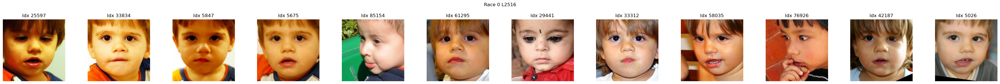


🎨 Race 1
Latent 4051 top images: [73010, 86162, 10324, 36465, 14885, 52247, 25943, 25833, 70579, 62738, 33918, 3529]


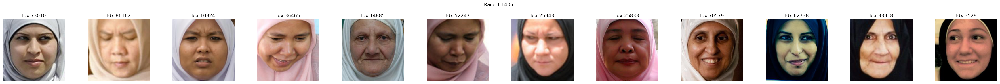

Latent 587 top images: [69177, 27608, 7601, 41589, 13040, 66050, 39434, 6929, 15035, 67176, 48784, 37764]


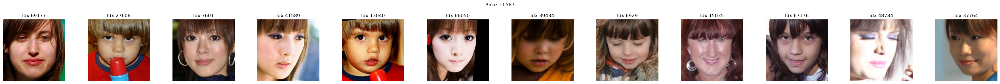

Latent 2379 top images: [86388, 8569, 45333, 40381, 13702, 52058, 8319, 68064, 4882, 39894, 45430, 69542]


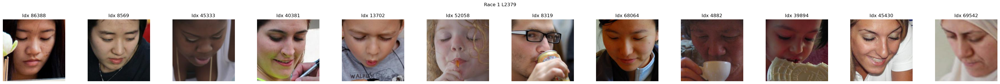

Latent 2054 top images: [52392, 81807, 61036, 16172, 78504, 351, 34981, 11355, 82858, 62778, 54216, 22468]


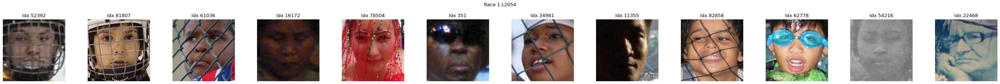

Latent 781 top images: [20321, 27445, 19560, 16580, 71598, 86227, 82770, 7345, 52462, 85361, 20115, 9887]


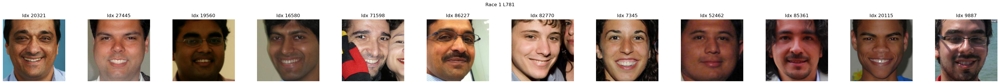


🎨 Race 2
Latent 3142 top images: [27460, 36408, 7547, 54341, 41769, 69259, 85647, 42880, 38761, 68095, 11053, 86117]


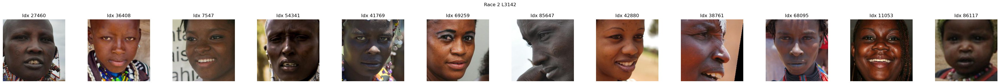

Latent 2416 top images: [62106, 82462, 35990, 51350, 10997, 9810, 55612, 76512, 34498, 74011, 84558, 16362]


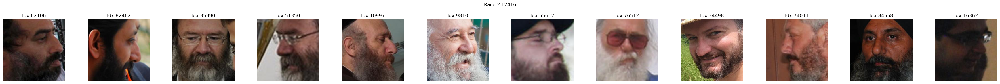

Latent 1511 top images: [30536, 86098, 70369, 55397, 5445, 50164, 21661, 80047, 35062, 4304, 39234, 15175]


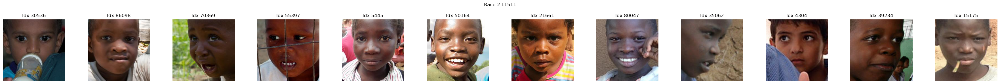

Latent 2426 top images: [46166, 33820, 20081, 32156, 75626, 60361, 55722, 54119, 38645, 3818, 4882, 66923]


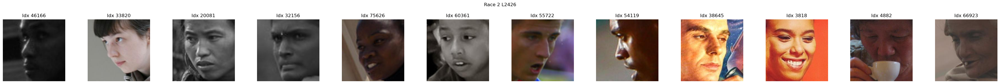

Latent 3122 top images: [51803, 58573, 82833, 17525, 83876, 35411, 84961, 58683, 16658, 40444, 37392, 47317]


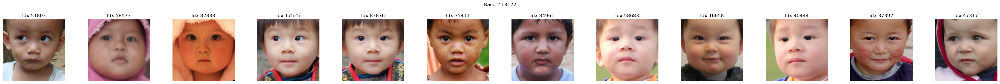

Latent 1490 top images: [81807, 58476, 47144, 61036, 19714, 38499, 32351, 84661, 20933, 63174, 29318, 66050]


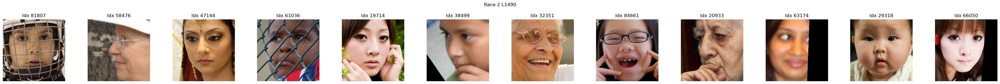


🎨 Race 3
Latent 3784 top images: [74565, 27869, 21280, 81530, 56536, 55159, 73234, 18265, 61153, 69238, 5085, 59708]


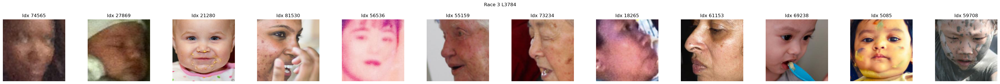


🎨 Race 5
Latent 316 top images: [24063, 57151, 14936, 56254, 70338, 71486, 25167, 22112, 2860, 8300, 44137, 20284]


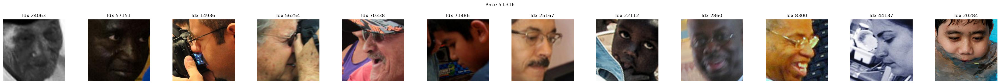


🎨 Race 6
Latent 2467 top images: [4231, 34754, 33962, 58786, 25737, 38038, 24347, 5294, 65128, 77599, 22321, 18590]


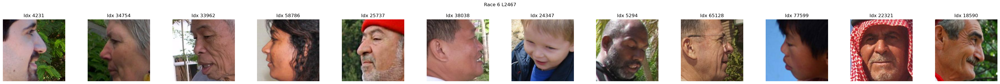

In [41]:
import pandas as pd

# Load your alignment CSV
#df = pd.read_csv("filtered_top5_image_indices_per_sdf_per_race.csv")
df = pd.read_csv("filtered_unique_sdf_latents.csv")

# Get all original indices as a list (remove duplicates if you like)
original_indices = df['original_index'].unique().tolist()

print(len(original_indices))

from datasets import load_dataset

ds = load_dataset("HuggingFaceM4/FairFace", "0.25", split="train")

def show_images_by_indices(indices, dataset, labels=None, title_prefix=""):
    k = len(indices)
    fig, axes = plt.subplots(1, k, figsize=(3 * k, 3))
    if k == 1:
        axes = [axes]
    for i, idx in enumerate(indices):
        img = dataset[idx]["image"]
        axes[i].imshow(img)
        label = f"Idx {idx}"
        if labels is not None:
            label += f"\nRace: {labels[i]}"
        axes[i].set_title(label)
        axes[i].axis('off')
    plt.suptitle(title_prefix)
    plt.tight_layout()
    plt.show()

# Group by race and latent
for race in sorted(df['race'].unique()):
    print(f"\n🎨 Race {race}")
    sub_race = df[df['race'] == race]
    for latent in sub_race['latent'].unique():
        sub_latent = sub_race[sub_race['latent'] == latent]
        original_indices = sub_latent['original_index'].tolist()
        print(f"Latent {latent} top images: {original_indices}")
        show_images_by_indices(original_indices, ds, title_prefix=f"Race {race} L{latent}\n")


In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from datasets import load_dataset

selected_latents_by_race = {
    2: [1511, 3142, 670, 932, 155, 1917], 
    0: [2260, 464],
    1: [1109, 781, 3301], 
    3: [1682, 1785], 
    6: [1842]
}

import os
import h5py
import numpy as np
from datasets import load_dataset
from PIL import Image

# --- Config ---
LATENT_H5 = "sae_agg_latents.hdf5"
EPSILON = 1e-5
TOP_K = 12
SAVE_DIR = "labeled_images"

# --- Load HDF5 data ---
print("Loading latent activations...")
with h5py.File(LATENT_H5, "r") as f:
    latents = f["training/data/mean"][:]             # (N, D)
    original_indices = f["training/original_indices"][:]

print(f"Loaded {latents.shape[0]} samples with {latents.shape[1]} latent dimensions.")

# --- Load image dataset ---
print("Loading FairFace dataset...")
ds = load_dataset("HuggingFaceM4/FairFace", "0.25", split="train")

# --- Create folder and save ---
def save_images(indices, dataset, out_dir):
    os.makedirs(out_dir, exist_ok=True)
    for rank, idx in enumerate(indices):
        img = dataset[int(idx)]["image"]
        filename = f"{rank:05d}_idx{idx}.jpg"
        img.save(os.path.join(out_dir, filename))

# --- Loop through each race + latent ---
for race, latents_list in selected_latents_by_race.items():
    for latent_idx in latents_list:
        activations = latents[:, latent_idx]
        top_idxs = np.argsort(-activations)[:TOP_K]
        top_originals = [int(original_indices[i]) for i in top_idxs]
        
        out_path = os.path.join(SAVE_DIR, f"race_{race}_latent_{latent_idx}")
        print(f"Saving {TOP_K} images to {out_path}...")
        save_images(top_originals, ds, out_path)

print("✅ Done saving all image folders.")




Loading latent activations...
Loaded 11842 samples with 4096 latent dimensions.
Loading FairFace dataset...
Saving 12 images to labeled_images/race_2_latent_1511...
Saving 12 images to labeled_images/race_2_latent_3142...
Saving 12 images to labeled_images/race_2_latent_670...
Saving 12 images to labeled_images/race_2_latent_932...
Saving 12 images to labeled_images/race_2_latent_155...
Saving 12 images to labeled_images/race_2_latent_1917...
Saving 12 images to labeled_images/race_0_latent_2260...
Saving 12 images to labeled_images/race_0_latent_464...
Saving 12 images to labeled_images/race_1_latent_1109...
Saving 12 images to labeled_images/race_1_latent_781...
Saving 12 images to labeled_images/race_1_latent_3301...
Saving 12 images to labeled_images/race_3_latent_1682...
Saving 12 images to labeled_images/race_3_latent_1785...
Saving 12 images to labeled_images/race_6_latent_1842...
✅ Done saving all image folders.


In [62]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
import os

# Parameters
LATENT_H5 = "sae_agg_latents.hdf5"
SAVE_DIR = "plots/activations_per_image"
TOP_N = 2  # images per latent

# Your hand-picked latents
selected_latents_by_race = {
    2: [1511, 3142, 670, 932, 155, 1917], 
    0: [2260, 464],
    1: [1109, 781, 3301], 
    3: [1682, 1785], 
    6: [1842]
}

# --- Load data ---
with h5py.File(LATENT_H5, "r") as f:
    latents = f['training/data/mean'][:]             # (N, D)
    original_indices = f['training/original_indices'][:]

n_samples, n_latents = latents.shape
print(f"✅ Loaded {n_samples} samples with {n_latents} latents")

# --- Make output folder ---
os.makedirs(SAVE_DIR, exist_ok=True)

# --- Plotting ---
def plot_image_latents(latent_vector, highlight_latent, image_index, latent_id, race, out_path):
    plt.figure(figsize=(12, 4))
    x_vals = np.arange(len(latent_vector))
    plt.bar(x_vals, latent_vector, width=1.0, alpha=0.7)
    plt.scatter(highlight_latent, latent_vector[highlight_latent], color='red', s=40, zorder=5)
    plt.text(highlight_latent, latent_vector[highlight_latent] + 0.02, f"{highlight_latent}", 
            ha='center', va='bottom', color='red', fontsize=9)
    plt.scatter(highlight_latent, latent_vector[highlight_latent], color='red', s=40, zorder=5)
    plt.text(highlight_latent, latent_vector[highlight_latent] + 2, f"{highlight_latent}", ha='center', color='red')
    plt.title(f"Race {race} • Image {image_index} • Highlight: Latent {latent_id}")
    plt.xlabel("Latent Index")
    plt.ylabel("Activation")
    plt.tight_layout()
    plt.savefig(out_path)
    plt.close()

# --- Main loop ---
for race, latents_list in selected_latents_by_race.items():
    for latent_id in latents_list:
        acts = latents[:, latent_id]
        top_idxs = np.argsort(-acts)[:TOP_N]
        
        for i, idx in enumerate(top_idxs):
            image_vec = latents[idx]
            original_idx = original_indices[idx]
            out_file = os.path.join(
                SAVE_DIR,
                f"race{race}_latent{latent_id}_img{i}_orig{original_idx}.png"
            )
            plot_image_latents(image_vec, highlight_latent=latent_id,
                               image_index=original_idx,
                               latent_id=latent_id,
                               race=race,
                               out_path=out_file)

print(f"✅ Plots saved to: {SAVE_DIR}")



✅ Loaded 11842 samples with 4096 latents


/var/folders/8d/rp6zg8y1473_xj3hsf6ls4b00000gn/T/ipykernel_23294/2537975534.py:44: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


✅ Plots saved to: plots/activations_per_image


In [63]:
import matplotlib.pyplot as plt
import numpy as np
from datasets import load_dataset

# Load once outside the loop
fairface = load_dataset("HuggingFaceM4/FairFace", "0.25", split="train")

def plot_image_with_activations_from_index(orig_idx, latent_vector, highlight_latent, race, save_path):
    image = fairface[int(orig_idx)]["image"]

    fig, axs = plt.subplots(1, 2, figsize=(12, 4), gridspec_kw={'width_ratios': [1, 2]})

    # -- Panel 1: Show input image --
    axs[0].imshow(image)
    axs[0].axis("off")
    axs[0].set_title(f"Input Image\nRace {race} • Orig {orig_idx}")

    # -- Panel 2: Activation bar chart --
    x_vals = np.arange(len(latent_vector))
    axs[1].bar(x_vals, latent_vector, width=1.0, alpha=0.7, color="skyblue")

    axs[1].scatter(
        highlight_latent, latent_vector[highlight_latent],
        color='red', s=40, zorder=5
    )
    axs[1].text(
        highlight_latent, latent_vector[highlight_latent] + 0.02,
        f"{highlight_latent}", ha='center', va='bottom', color='red', fontsize=9
    )

    axs[1].set_ylim(0, max(latent_vector) * 1.1)
    axs[1].set_xlabel("Latent Index")
    axs[1].set_ylabel("Activation")
    axs[1].set_title(f"Activations • Highlight: {highlight_latent}")

    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()


In [ ]:
import os
import re
import h5py
import numpy as np
import matplotlib.pyplot as plt
from datasets import load_dataset

# Constants
LATENT_H5 = "sae_agg_latents.hdf5"
ROOT_DIR = "./labeled_images"  # adjust if needed
SAVE_DIR = "plots/combined_panels"
os.makedirs(SAVE_DIR, exist_ok=True)

# Load FairFace dataset once
fairface = load_dataset("HuggingFaceM4/FairFace", "0.25", split="train")

# Load HDF5 latents
with h5py.File(LATENT_H5, "r") as f:
    latents = f['training/data/mean'][:]
    race_labels = f['training/labels/race'][:]
    original_indices = f['training/original_indices'][:]

# Map from original_idx to latent row
orig_idx_to_latent = {int(orig): latents[i] for i, orig in enumerate(original_indices)}
orig_idx_to_race = {int(orig): int(race_labels[i]) for i, orig in enumerate(original_indices)}

# Plot function (from your code)
def plot_image_with_activations_from_index(orig_idx, latent_vector, highlight_latent, race, save_path):
    image = fairface[int(orig_idx)]["image"]

    fig, axs = plt.subplots(1, 2, figsize=(12, 4), gridspec_kw={'width_ratios': [1, 2]})

    axs[0].imshow(image)
    axs[0].axis("off")
    axs[0].set_title(f"Input Image\nRace {race} • Orig {orig_idx}")

    x_vals = np.arange(len(latent_vector))
    axs[1].bar(x_vals, latent_vector, width=1.0, alpha=0.7, color="skyblue")
    axs[1].scatter(highlight_latent, latent_vector[highlight_latent], color='red', s=40, zorder=5)
    axs[1].text(highlight_latent, latent_vector[highlight_latent] + 0.02, f"{highlight_latent}", ha='center', va='bottom', color='red', fontsize=9)
    axs[1].set_ylim(0, max(latent_vector) * 1.1)
    axs[1].set_xlabel("Latent Index")
    axs[1].set_ylabel("Activation")
    axs[1].set_title(f"Activations • Highlight: {highlight_latent}")

    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()

# Walk through each directory and image
pattern = re.compile(r"race_(\d+)_latent_(\d+)")
for subdir in os.listdir(ROOT_DIR):
    match = pattern.match(subdir)
    if not match:
        continue
    race = int(match.group(1))
    latent_id = int(match.group(2))

    subdir_path = os.path.join(ROOT_DIR, subdir)
    for filename in os.listdir(subdir_path):
        if not filename.endswith(".jpg"):
            continue
        orig_match = re.search(r"idx(\d+)", filename)
        if not orig_match:
            continue
        orig_idx = int(orig_match.group(1))

        if orig_idx not in orig_idx_to_latent:
            print(f"Warning: orig_idx {orig_idx} not found in HDF5")
            continue

        latent_vec = orig_idx_to_latent[orig_idx]
        race_from_hdf5 = orig_idx_to_race[orig_idx]
        # assert race == race_from_hdf5, f"Race mismatch for {orig_idx}"

        out_path = os.path.join(SAVE_DIR, f"race{race}_latent{latent_id}_orig{orig_idx}.png")
        plot_image_with_activations_from_index(orig_idx, latent_vec, latent_id, race, out_path)

print(f"Done! Plots saved in {SAVE_DIR}")


AssertionError: Race mismatch for 67675

In [67]:
# Load from your HDF5 latents
with h5py.File('sae_agg_latents.hdf5', 'r') as f:
    latents = f['training/data/mean'][:]             # (N, D)
    race_labels = f['training/labels/race'][:]       # (N,)
    original_indices = f['training/original_indices'][:]  # (N,)

# Pick a latent and get the top activating image
latent_idx = 3142
top_idx = np.argsort(-latents[:, latent_idx])[:2][0]
vec = latents[top_idx]

plot_image_with_activations_from_index(
    orig_idx=original_indices[top_idx],
    latent_vector=vec,
    highlight_latent=latent_idx,
    race=race_labels[top_idx],
    save_path="example_combined_plot.png"
)

In [52]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from datasets import load_dataset

# --- Parameters ---
LATENT_FILE = "sae_agg_latents.hdf5"
LATENT_PATH = "training/data/mean"
LABEL_PATH = "training/labels/race"
INDEX_PATH = "training/original_indices"
RACE_THRESHOLD = 0.20
EPSILON = 1e-7
TOP_K = 12

# --- Load Data ---
print("Loading HDF5 data...")
with h5py.File(LATENT_FILE, 'r') as f:
    latents = f[LATENT_PATH][:]
    race_labels = f[LABEL_PATH][:]
    original_indices = f[INDEX_PATH][:]

n_samples, n_latents = latents.shape
print(f"Loaded {n_samples} samples with {n_latents} latent dimensions.\n")

# Load image dataset
print("Loading FairFace dataset...")
ds = load_dataset("HuggingFaceM4/FairFace", "0.25", split="train")

print("done loading dataset")
def show_images(indices, title_prefix):
    fig, axes = plt.subplots(1, len(indices), figsize=(3 * len(indices), 3))
    if len(indices) == 1:
        axes = [axes]
    for i, idx in enumerate(indices):
        img = ds[idx]['image']
        axes[i].imshow(img)
        axes[i].set_title(f"Idx {idx}")
        axes[i].axis('off')
    plt.suptitle(title_prefix)
    plt.tight_layout()
    plt.show()

# --- Analyze each latent ---
for latent_idx in range(n_latents):
    acts = latents[:, latent_idx]
    sig_mask = acts > EPSILON
    if sig_mask.sum() < 10:
        continue

    active_races = race_labels[sig_mask]
    total = len(active_races)
    counts = np.bincount(active_races, minlength=race_labels.max() + 1)
    proportions = counts / total

    top_race = np.argmax(proportions)
    top_prop = proportions[top_race]

    if top_prop > RACE_THRESHOLD:
        print(f"Latent {latent_idx} strongly activates for race {top_race} ({top_prop:.2%})")

        # Show top activating images
        top_idxs = np.argsort(-acts)[:TOP_K]
        top_originals = [int(original_indices[i]) for i in top_idxs]
        print(f"Top {TOP_K} original indices: {top_originals}")
        #show_images(top_originals, f"Latent {latent_idx} — Race {top_race} ({top_prop:.2%})")


Loading HDF5 data...
Loaded 11842 samples with 4096 latent dimensions.

Loading FairFace dataset...
done loading dataset
Latent 15 strongly activates for race 3 (26.37%)
Top 12 original indices: [40413, 39204, 71550, 79046, 73159, 71952, 47558, 47433, 23028, 18577, 82874, 24193]
Latent 43 strongly activates for race 1 (22.28%)
Top 12 original indices: [17510, 47433, 44646, 34195, 67945, 73564, 12523, 52886, 84085, 79617, 66620, 80612]
Latent 114 strongly activates for race 3 (22.22%)
Top 12 original indices: [20606, 30628, 71327, 2506, 14936, 28912, 62125, 38390, 86362, 34699, 44604, 5631]
Latent 150 strongly activates for race 3 (20.75%)
Top 12 original indices: [47433, 42642, 24895, 16386, 84168, 69383, 19108, 34195, 60612, 15218, 8301, 446]
Latent 155 strongly activates for race 2 (40.69%)
Top 12 original indices: [27460, 54341, 68095, 36408, 41769, 50331, 22861, 80047, 45089, 41015, 38761, 64468]
Latent 195 strongly activates for race 1 (21.40%)
Top 12 original indices: [25710, 849